## Descrição das variáveis:

Variáveis categoricas: condition, waterfront

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')

import warnings

warnings.filterwarnings('ignore')

# Importando Modelo de regressão pronto

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [3]:
house_data = pd.DataFrame(pd.read_csv("kc_house_data.csv"))
print(house_data.columns)
house_data.head()


Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [5]:
# Converte variáveis para o tipo gategory

house_data["condition"] = house_data["condition"].astype("category")

house_data["waterfront"] = house_data["waterfront"].astype("category")

house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             21613 non-null  int64   
 1   date           21613 non-null  object  
 2   price          21613 non-null  float64 
 3   bedrooms       21613 non-null  int64   
 4   bathrooms      21613 non-null  float64 
 5   sqft_living    21613 non-null  int64   
 6   sqft_lot       21613 non-null  int64   
 7   floors         21613 non-null  float64 
 8   waterfront     21613 non-null  category
 9   view           21613 non-null  int64   
 10  condition      21613 non-null  category
 11  grade          21613 non-null  int64   
 12  sqft_above     21613 non-null  int64   
 13  sqft_basement  21613 non-null  int64   
 14  yr_built       21613 non-null  int64   
 15  yr_renovated   21613 non-null  int64   
 16  zipcode        21613 non-null  int64   
 17  lat            21613 non-null  

In [6]:
house_data.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [7]:
# house_data = pd.get_dummies(house_data)
# house_data.head()

In [8]:
#Dividindo a coluna de datas em ano, mês, dia 

house_data['date'] = pd.to_datetime(house_data['date'])
house_data['year'] = house_data['date'].dt.year
house_data['month'] = house_data['date'].dt.month
house_data['day'] = house_data['date'].dt.day

house_data = house_data.drop("date",axis=1)

house_data.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,13
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,9
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,25
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,9
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,18


In [9]:
# Retirando a coluna ID
data = house_data.drop(["id"], axis = 1)
#Definindo a variável a ser prevista
y = data["price"]
x = data.drop(["price"], axis = 1)

In [10]:
x

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,13
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,9
2,2,1.00,770,10000,1.0,0,0,3,6,770,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,25
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,9
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,3,2.50,1530,1131,3.0,0,0,3,8,1530,...,2009,0,98103,47.6993,-122.346,1530,1509,2014,5,21
21609,4,2.50,2310,5813,2.0,0,0,3,8,2310,...,2014,0,98146,47.5107,-122.362,1830,7200,2015,2,23
21610,2,0.75,1020,1350,2.0,0,0,3,7,1020,...,2009,0,98144,47.5944,-122.299,1020,2007,2014,6,23
21611,3,2.50,1600,2388,2.0,0,0,3,8,1600,...,2004,0,98027,47.5345,-122.069,1410,1287,2015,1,16


In [11]:
y

0        221900.0
1        538000.0
2        180000.0
3        604000.0
4        510000.0
           ...   
21608    360000.0
21609    400000.0
21610    402101.0
21611    400000.0
21612    325000.0
Name: price, Length: 21613, dtype: float64

In [12]:
X_train, X_test, y_train, y_test = \
    train_test_split(x, y, random_state=42, train_size=0.8, shuffle=True)
print ("train size={}, test_size={}, total_size={}".format(
    X_train.shape[0], X_test.shape[0], data.shape[0])
)

train size=17290, test_size=4323, total_size=21613


In [13]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)
print("num_ftrs = {}, num_coeff = {} ".format(X_train.shape[1], len(model.coef_)))
reg_coeff = dict(zip(x.columns, model.coef_))
print(reg_coeff)

num_ftrs = 21, num_coeff = 21 
{'bedrooms': -34500.24445697619, 'bathrooms': 44645.78172636836, 'sqft_living': 109.07588477277348, 'sqft_lot': 0.0858748177406171, 'floors': 7520.144434657496, 'waterfront': 563025.9976794741, 'view': 53411.743083636444, 'condition': 25847.317823299316, 'grade': 94723.86932728722, 'sqft_above': 70.02501814330046, 'sqft_basement': 39.05086635347939, 'yr_built': -2675.529832898493, 'yr_renovated': 21.63912858630198, 'zipcode': -553.7085355963175, 'lat': 598270.5352006953, 'long': -195001.8565263551, 'sqft_living15': 21.347778580928743, 'sqft_lot15': -0.32737768516374194, 'year': 36199.605238617114, 'month': 1139.2002658568654, 'day': -347.90482181300956}


Quality Test 39097299121.54099
Quality Control 44951491944.933624


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
 [Text(0, 0, 'bedrooms'),
  Text(1, 0, 'bathrooms'),
  Text(2, 0, 'sqft_living'),
  Text(3, 0, 'sqft_lot'),
  Text(4, 0, 'floors'),
  Text(5, 0, 'waterfront'),
  Text(6, 0, 'view'),
  Text(7, 0, 'condition'),
  Text(8, 0, 'grade'),
  Text(9, 0, 'sqft_above'),
  Text(10, 0, 'sqft_basement'),
  Text(11, 0, 'yr_built'),
  Text(12, 0, 'yr_renovated'),
  Text(13, 0, 'zipcode'),
  Text(14, 0, 'lat'),
  Text(15, 0, 'long'),
  Text(16, 0, 'sqft_living15'),
  Text(17, 0, 'sqft_lot15'),
  Text(18, 0, 'year'),
  Text(19, 0, 'month'),
  Text(20, 0, 'day')])

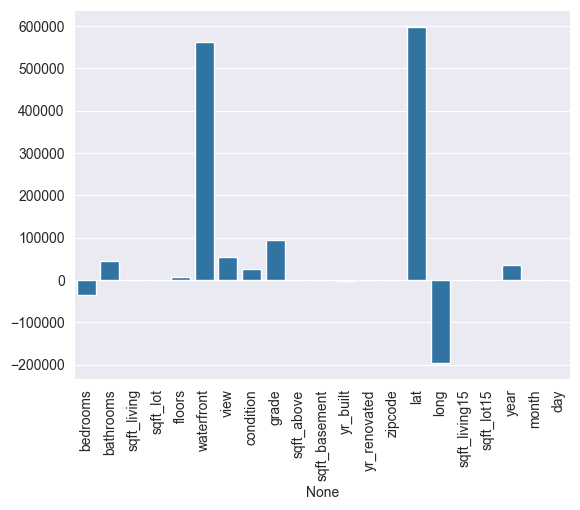

In [14]:
y_pred_train = model.predict(X_train)
print("Quality Test {}".format(mean_squared_error(y_train, y_pred_train)))
y_pred = model.predict(X_test)
print("Quality Control {}".format(mean_squared_error(y_test, y_pred)))

sns.barplot(x = X_train.columns, y=model.coef_)
plt.xticks(rotation=90)

In [15]:
print("Linear regression r2 score: ", r2_score(y_test,y_pred))

Linear regression r2 score:  0.7026559760834139


In [16]:
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,13
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,9
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,25
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,9
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,18


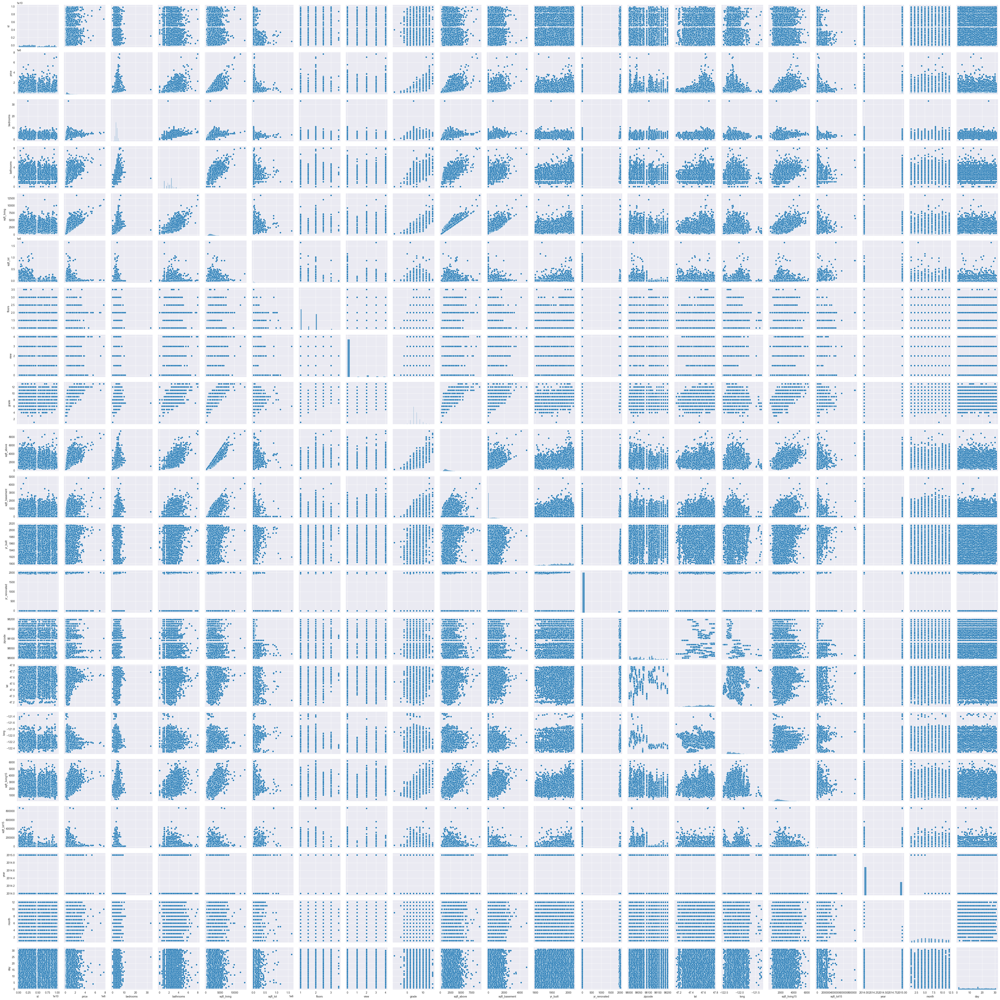

In [17]:
sns.pairplot(house_data)
plt.show()

In [18]:
# correlacao = house_data.corr()
# plt.figure(figsize=(20,15))
# sns.heatmap(correlacao, annot=True)
# plt.show()

Gráfico de correlação entre as variáveis

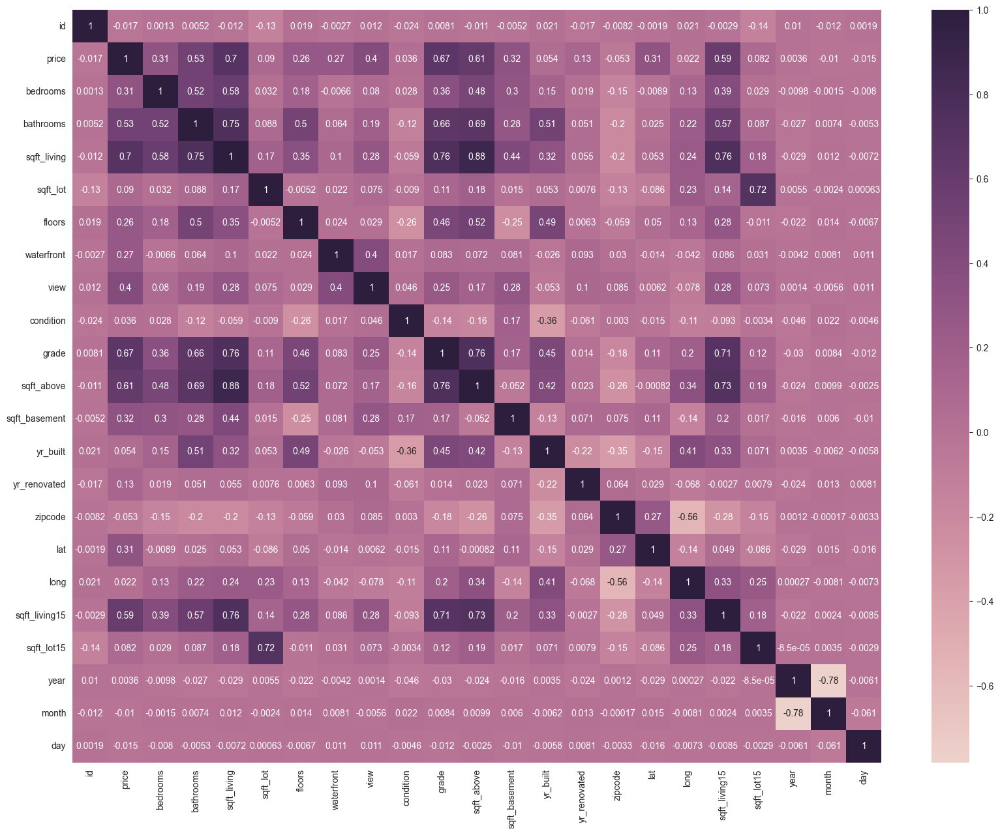

In [19]:
correlacao = house_data.corr(method = 'pearson')
plt.figure(figsize=(20,15))
sns.heatmap(correlacao, cmap=sns.cubehelix_palette(as_cmap=True), annot=True)
plt.show()

Box plot de variáveis categóricas

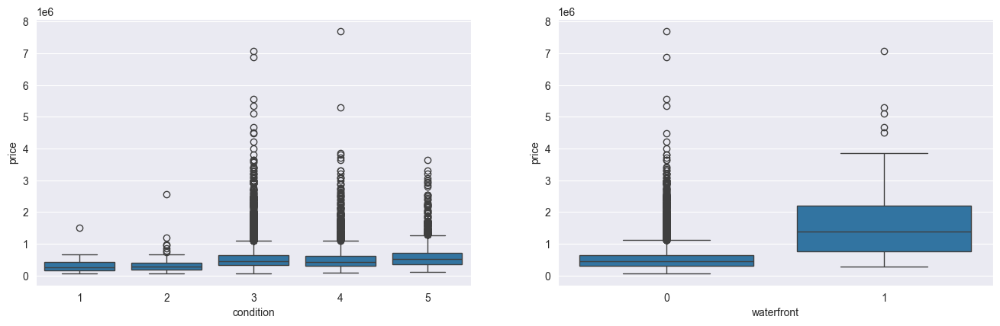

In [20]:
plt.figure(figsize=(25, 10))
plt.subplot(2,3,1)
sns.boxplot(x = "condition", y = "price", data = house_data)
plt.subplot(2,3,2)
sns.boxplot(x = "waterfront", y = "price", data = house_data)
plt.show()

In [21]:
house_data

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,13
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,9
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,25
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,9
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,...,2009,0,98103,47.6993,-122.346,1530,1509,2014,5,21
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,...,2014,0,98146,47.5107,-122.362,1830,7200,2015,2,23
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,...,2009,0,98144,47.5944,-122.299,1020,2007,2014,6,23
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,...,2004,0,98027,47.5345,-122.069,1410,1287,2015,1,16


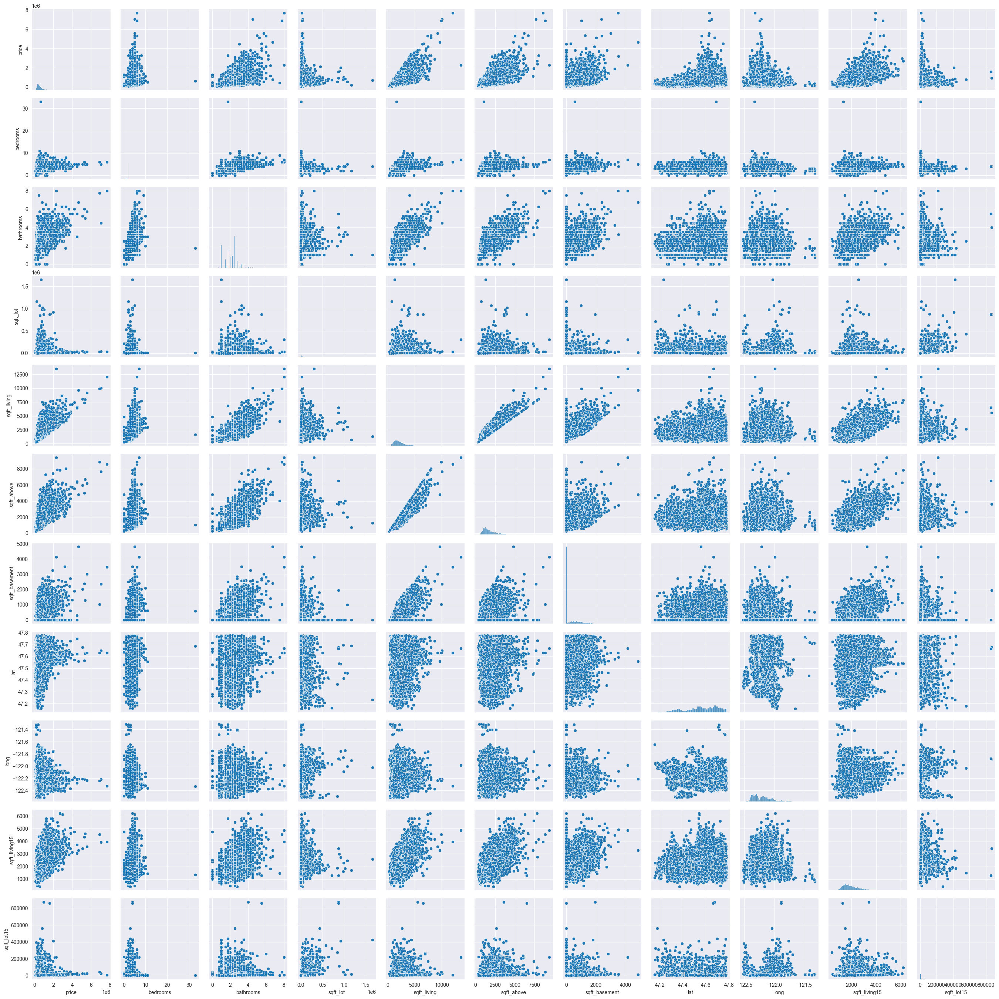

In [22]:
house_num = house_data[[ "price", "bedrooms", "bathrooms", "sqft_lot","sqft_living", "sqft_above", "sqft_basement", "lat", "long", "sqft_living15", "sqft_lot15"]]

sns.pairplot(house_num, palette = "purple")
plt.show()

In [23]:
def linear_regression_PI(x, y):
    x = np.hstack((np.ones((x.shape[0], 1)), x))

    w = (np.linalg.inv(x.T @ x) @ x.T) @ y

    return w

def predict(x, w):
     x = np.hstack((np.ones((x.shape[0], 1)), x))

     return x @ w

In [31]:
X_train

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
6325,3,1.75,1780,13095,1.0,0,0,4,9,1780,...,1983,0,98042,47.3670,-122.152,2750,13095,2014,5,27
13473,2,1.00,1000,3700,1.0,0,0,3,6,800,...,1929,0,98118,47.5520,-122.290,1270,5000,2015,3,10
17614,3,1.00,1080,7486,1.5,0,0,3,6,990,...,1942,0,98146,47.4838,-122.335,1170,7800,2015,2,26
16970,3,2.25,2090,7500,1.0,0,0,4,7,1280,...,1977,0,98031,47.3951,-122.172,1800,7350,2015,1,8
20868,2,2.50,1741,1439,2.0,0,0,3,8,1446,...,2007,0,98034,47.7043,-122.209,2090,10454,2015,4,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,3,1.50,1000,6914,1.0,0,0,3,7,1000,...,1947,0,98125,47.7144,-122.319,1000,6947,2014,11,13
21575,3,2.50,3087,5002,2.0,0,0,3,8,3087,...,2014,0,98023,47.2974,-122.349,2927,5183,2014,11,11
5390,3,2.50,2120,4780,2.0,0,0,3,7,2120,...,2004,0,98053,47.6810,-122.032,1690,2650,2014,9,30
860,1,0.75,380,15000,1.0,0,0,3,5,380,...,1963,0,98168,47.4810,-122.323,1170,15000,2014,6,20


In [32]:
y_train

6325     325000.0
13473    257000.0
17614    228500.0
16970    288000.0
20868    479000.0
           ...   
11964    378000.0
21575    399950.0
5390     575000.0
860      245000.0
15795    315000.0
Name: price, Length: 17290, dtype: float64

In [24]:
w = linear_regression_PI(X_train, y_train)

In [25]:
w

array([-4.94098347e+07, -6.48243281e+06,  2.78539182e+06,  9.72861593e+04,
       -6.49235269e-02, -1.21193408e+05, -1.66506561e+06,  1.67307815e+05,
        2.77825717e+04,  3.64349078e+04, -9.76008266e+04, -9.77719121e+04,
       -2.67552983e+03,  2.16391285e+01, -5.53708536e+02,  5.98270535e+05,
       -1.95001857e+05,  2.13477786e+01, -3.27377685e-01,  3.61996032e+04,
        1.13920003e+03, -3.47904828e+02])

In [26]:
y_pred_PI = predict(X_test, w)
y_pred_PI

array([-4006445.24032469, -8542563.93273078, -3338714.66205517, ...,
       -3545194.12117524, -5176863.06568396, -3590522.95071462])

In [29]:
print("Linear regression r2 score com sklearn: ", r2_score(y_test,y_pred))

Linear regression r2 score com sklearn:  0.7026559760834139


In [30]:
print("Linear regression r2 score com numpy: ", r2_score(y_test, y_pred_PI))

Linear regression r2 score com numpy:  -196.544294170354
